In [1]:
# choose:
impl, gpu = 'cuda', True # to run algorithms on a system with GPU/CUDA support
# impl, gpu = 'ref', False # for using CPU only 

# HR_Encoder - find your own images in StyleGAN2

The  [StyleGAN2](https://arxiv.org/abs/1912.04958) model is is capable of generating natural looking images out of (almost) nothing - even images that haven't been discovered yet.  
HR_Encoder extends Alberto Rosas Garcia's unofficial [StyleGAN2-Tensorflow-2.x implementation](https://github.com/rosasalberto/StyleGAN2-TensorFlow-2.x) to find your own images in StyleGAN2's *W* space.

**Legal information**

*HR_Encoder.ipynb*, *HR_Encoder.py* and *w_utilities.py* are **Copyright © 2020 [HANS ROETTGER](mailto:oss.roettger@posteo.org)** and distributed under the terms of **[GNU AGPLv3](https://www.gnu.org/licenses/agpl-3.0.html)**.

**Severability** clause: If a provision of the [GNU AGPLv3](https://www.gnu.org/licenses/agpl-3.0.html) is or becomes illegal, invalid or unenforceable in any jurisdiction, that shall not affect: 
1. the validity or enforceability in that jurisdiction of any other provision of the GNU AGPLv3; or 
2. the validity or enforceability in other jurisdictions of that or any other provision of the GNU AGPLv3.

<span style="color:red">**⚠️ Warning**</span>: HR_Encoder makes heavy use of your hardware via the [tensorflow](https://www.tensorflow.org/) libraries. Pay attention to adequate ventilation/ cooling and take all necessary precautions to prevent overload, overheating or consequential damage according to the recommendations of your hardware provider.

**All images** used to showcase HR_Encoder are copyrighted by their respective owners and were provided by them [CC0](https://creativecommons.org/publicdomain/zero/1.0/deed.en)/PD/[pixabay](https://pixabay.com/service/license/): [1](https://de.m.wikipedia.org/wiki/Datei:Angela_Merkel_(2016-09-16_BRATISLAVA_SUMMIT).jpg)
[2](https://www.maxpixel.net/Che-Red-Revolution-Silhouette-Stripes-Guevara-158841)
[3](https://commons.wikimedia.org/wiki/File:Der_Samtrote_Sonderk%C3%A4fer.jpg)
[4](https://pixabay.com/photos/ferrari-488-ferrari-488-gtb-4345304/)
[5](https://pixnio.com/fauna-animals/cats-and-kittens/cat-kitten-pet-cute-animal-portrait-sleep-textil-fur)
[6](https://www.maxpixel.net/Cologne-Cathedral-Dom-Bridge-Cologne-Church-1111696)
[7](https://commons.wikimedia.org/wiki/File:Karl_Volkers_-_Portrait_of_a_Jockey_on_his_Horse.jpg)

<table style="width: 100%">
<tr>
    <td>
        <table border="0">
            <tr><img src="./HR_videos/1e.gif" alt="" height=256 width=256 border=3></img></tr>
            <tr><img src="./HR_videos/manipulation12.gif" alt="" height=256 width=256 border=3></img></tr>
        </table>
    </td>
    <td colspan=2><img src="./HR_videos/morphing34.gif" alt="" border=3></img></td>
    <td>
        <table border="0">
            <tr><img src="./HR_videos/5.gif" alt="" height=256 width=256 border=3></img></tr>
            <tr><img src="./HR_videos/6.gif" alt="" height=256 width=256 border=3></img></tr>
        </table>
    </td>
</tr>
</table>

**Examples shown above** are generated in the notebook sections below. First column visualizes encoding of a portrait and ease of manipulation in *W* space (sunglasses added / image style changed). Middle shows the result of morphing in *W* space. Finally encoding results for further StyleGAN2 domain models.

### In a nutshell, [(High Resolution) HR_Encoder]() calculates StyleGAN2 latent codes *w&#8407;∈W* for your images
>## 🐱 ➡️` HR_Encoder `↘️ 
>## &nbsp;&nbsp;&nbsp;&nbsp;&nbsp; (random) *z&#8407;*&nbsp; ➡️ &nbsp;&nbsp;*w&#8407;*&nbsp; ➡️` StyleGAN2 Generator `➡️ 🐱 
### ... and StyleGAN2 generates natural looking images from your (manipulated) latent codes *w&#8407;*

**What for?** HR_Encoder transfers your images into StyleGAN2's *W* space and enables you to apply [state of the art image manipulation](https://www.youtube.com/watch?v=9QuDh3W3lOY) to your own material. Simple computations on latent codes *w&#8407;∈W* create [fantastic effects](https://www.youtube.com/watch?v=jdTICDa_eAI) in the StyleGAN2-generated images.

**What is new?** In contrast to Dmitry Nikitko's [original encoder](https://github.com/Puzer/stylegan-encoder), HR_Encoder uses the StyleGAN2 discriminator model itself instead of the VGG16 model to preserve high level image features during encoding - resulting in latent codes *w&#8407;* for very sharp and detailed images.<br> 
BTW: this approach leads to a more consice algorithm without need of complicated image similarity metrics.

**Is the encoding lossless?** No, not at all. But StyleGAN2 generates naturally looking images very similar to your input images, although details might be missing or could be artificially invented.

**Requirements?** HR_Encoder requires an existing [tensorflow2](https://www.tensorflow.org/install) environment and uses up to 8 GB of RAM or GPU memory. It is possible to run the algorithms on a CPU without Nvidia GPU/ Cuda support - although it takes plenty of time (see run time estimations in the model descriptions below).

## w_utilities.py contains utility functions for handling and rendering latent vectors w

In [2]:
# video rendering in w_utilities depends on the following libraries
!pip3 install --upgrade pip
!pip3 install moviepy
!pip3 install opencv-python-headless

Requirement already up-to-date: pip in /usr/local/lib/python3.6/dist-packages (20.2.2)


In [3]:
import w_utilities as w_

# The StyleGAN2 'ffhq' portrait model
StyleGAN2 ffhq is a high quality model able to generate portrait images for all kind of persons.
* model resolution= (1024,1024,3)
* w⃗ has a shape of (18,512)
* recommended encodeImage() parameters=[1.0,0.02,400.0,3.0,0.02]

Encoding one image of a face with 200 optimization steps takes
* approx.  2:45 minutes on a i7-8700T + Nvidia GTX 1050 4GB (imp='cuda',gpu=True)
* approx. 57:00 minutes on a i7-1065G7 w/o CUDA support (imp='ref',gpu=False)

Setting up TensorFlow plugin "upfirdn_2d.cu": Preprocessing... Loading... Done.
Loaded ffhq discriminator weights!
Loaded ffhq generator weights!
HR_Encoder initializing...


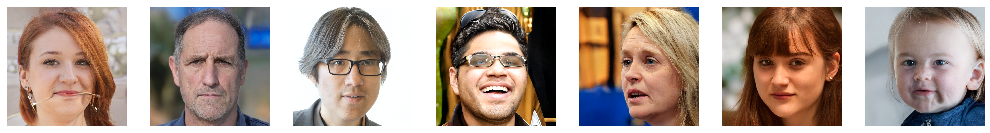

In [4]:
import numpy as np
from stylegan2_generator import StyleGan2Generator
from stylegan2_discriminator import StyleGan2Discriminator
from HR_Encoder import HR_Encoder

model_name = 'ffhq' # face model trained by Nvidia
model_resolution=(1024,1024,3)
model_latent_dim=(18,512)

features = StyleGan2Discriminator(weights=model_name, impl=impl, gpu=gpu, resolution=model_resolution[0],diversion_layer=4)
generator = StyleGan2Generator(weights=model_name, impl=impl, gpu=gpu, resolution=model_resolution[0])
w_model_avg = np.load('weights/{}_dlatent_avg.npy'.format(model_name))

encoder=HR_Encoder(generator,features,resolution=model_resolution)

# show some randomly generated examples
w_.showImages(generator,[[w_.random(generator,seed) for seed in range(7)]],(2.5,2.5))

## Encode your portrait images within the 'ffhq' model
* for best results use portrait images with image center right between the eyes
* use square image sections in high resolution (results are 1024x1024 pixel - input resolution should be similar)
* encodeImage() accepts .png and .jpg files
* encodeImage() parameters=[1.0,0.02,400.0,3.0,0.02] work for almost all natural faces (see HR_Encoder.py for parameter description)
* start the encoding with StyleGAN2 model's *average w&#8407;* to speed-up the optimization process
* in complicated cases start with an existing *w&#8407;* for a similar image (see "smokey eyes" trick below and the "horse" section) 
* theoretically you could start with a totally random *w&#8407;*, but then the encoding process would take ages
* for artificial looks (strong makeup, masks, superheroes) try parameters=[1.0,0.02,100.0,<span style="color:blue">50.0</span>,0.02]
* during encoding *loss=x%* indicates the encoding error in relation to the starting value (should go down over time)

In [5]:
my_input_image="./HR_images/1.jpg" # your input image
my_output_w="./w_space/w1.npy" # resulting latent vector w
my_output_video="./HR_videos/1e.mp4" # video of encoding process
my_output_gif="./HR_videos/1e.gif"

HR_Encoder  199/ 200: [ 1.000, 0.020,400.000, 3.000, 0.020], loss≈ 12.8 %   
  best loss≈ 12.8 %


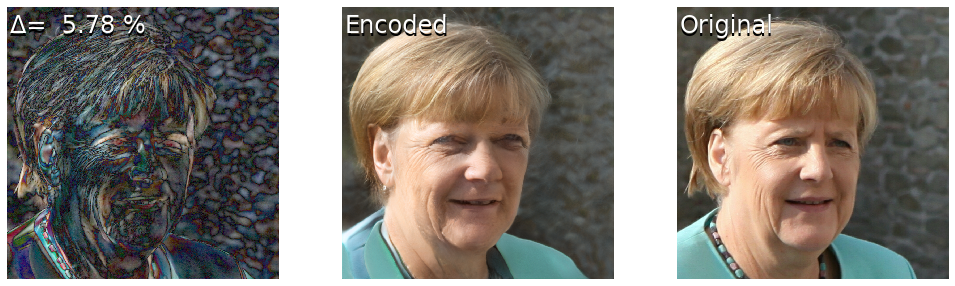

In [6]:
# start encoding with average w to speed up encoding process
w_start=np.ones(model_latent_dim).astype(np.float32)*w_model_avg
# trick: add 66% of female and male sunglasses to average, otherwise sunglasses might be coded as "smokey eyes"
w_start=(w_start+w_.random(generator,331)+w_.random(generator,96))/3
w_tape=[w_start]

# encodeImage()
# - starts optimization process with last w in w_tape
# - and appends to w_tape the w of each optimization step and finally the best fitting w 
w_tape,target_img=encoder.encodeImage(my_input_image,w_tape,steps=200,parameters=[1.0,0.02,400.0,3.0,0.02])

# save best fitting w for further use
np.save(my_output_w,w_tape[-1])

# show encoded image 
# delta = mean difference per pixel color channel for the StyleGAN2 generated image
# delta can change a little bit with each call of showDifference(), since StyleGAN2 generates variations
w_.showDifference(generator,w_tape[-1],target_img)

In [7]:
# visualize encoding process
w_.renderVideo(generator,(w_.speedupTape(w_tape,speed=0.1,acc=1.15)+[w_tape[-1]]*5)[5::],my_output_video,video_fps=15)
w_.videoGIF(my_output_video,my_output_gif,video_fps=15)
w_.showVideo(my_output_video,height=256)

## Ease of manipulation in *W* space - let StyleGAN2 choose your glasses and style
See [ 	arXiv:2004.02546](https://arxiv.org/abs/2004.02546) how to define your own image manipulations in *W* space

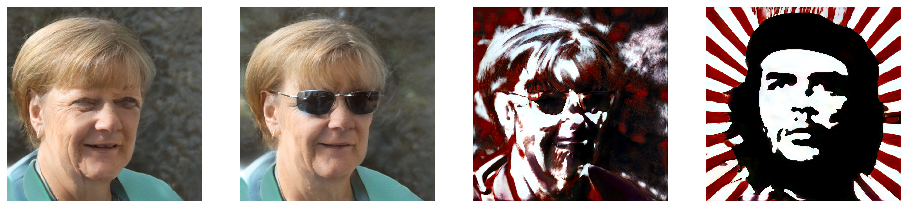

In [8]:
my_input_w="./w_space/w1.npy" # input latent vector w
my_input_w2="./w_space/w2.npy"
my_output_video="./HR_videos/manipulation12.mp4" # output video of im
my_output_gif="./HR_videos/manipulation12.gif"
my_latent_op="./w_space/sunglasses.npy" # predefined operation in W space
op_weight=13
original=np.load(my_input_w)
comic=np.load(my_input_w2)
operation=np.load(my_latent_op)
# Add glasses
manipulation1=w_.mask(original,[0,3,7,8,9,10,11,12,13,14,15,16,17])+w_.mask(((original+operation*op_weight)/1.1).astype(np.float32),[1,2,4,5,6])
# Style Transfer
manipulation2=w_.mask(manipulation1,[0,1,2,3,4,5,6,7,8])+w_.mask(comic,[9,10,11,12,13,14,15,16,17])
w_.showImages(generator,[original,manipulation1,manipulation2,comic],(4,4))
w_.renderVideo(generator,[original,manipulation1,manipulation2],my_output_video,video_fps=1)
w_.videoGIF(my_output_video,my_output_gif,video_fps=1)
w_.showVideo(my_output_video,height=512)

# StyleGAN2 car model
StyleGAN2 car model generates images of passenger cars and sports cars
* model resolution= (512,512,3)
* *w&#8407;* has a shape of (16,512)
* recommended encodeImage() parameters=[1.0,0.01,100.0,25.0,0.02])

Encoding one image of a car with 200 optimization steps takes
* approx.  1:50 minutes on a i7-8700T + Nvidia GTX 1050 4GB (imp='cuda',gpu=True)
* approx. 31:00 minutes on a i7-1065G7 w/o CUDA support (imp='ref',gpu=False)

Loaded car discriminator weights!
Loaded car generator weights!
HR_Encoder initializing...


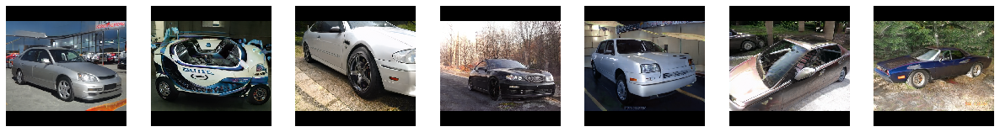

In [9]:
import numpy as np
from stylegan2_generator import StyleGan2Generator
from stylegan2_discriminator import StyleGan2Discriminator
from HR_Encoder import HR_Encoder

model_name = 'car' # car model trained by Nvidia
model_resolution=(512,512,3)
model_latent_dim=(16,512)

features = StyleGan2Discriminator(weights=model_name, impl=impl, gpu=gpu, resolution=model_resolution[0],diversion_layer=4)
generator = StyleGan2Generator(weights=model_name, impl=impl, gpu=gpu, resolution=model_resolution[0])
w_model_avg = np.load('weights/{}_dlatent_avg.npy'.format(model_name))

encoder=HR_Encoder(generator,features,resolution=model_resolution)

# some randomly generated examples
w_.showImages(generator,[[w_.random(generator,seed) for seed in range(7)]],(3,3))

In [10]:
car1_image="./HR_images/3.jpg" # first car
car2_image="./HR_images/4.jpg" # second car
car1_w="./w_space/w3.npy" # resulting latent vector w
car2_w="./w_space/w4.npy"
morph_video="./HR_videos/morphing34.mp4" # video of encoding process
morph_gif="./HR_videos/morphing34.gif" # as animated gif

HR_Encoder  199/ 200: [ 1.000, 0.010,100.000,25.000, 0.020], loss≈ 21.0 %   
  best loss≈ 21.0 %


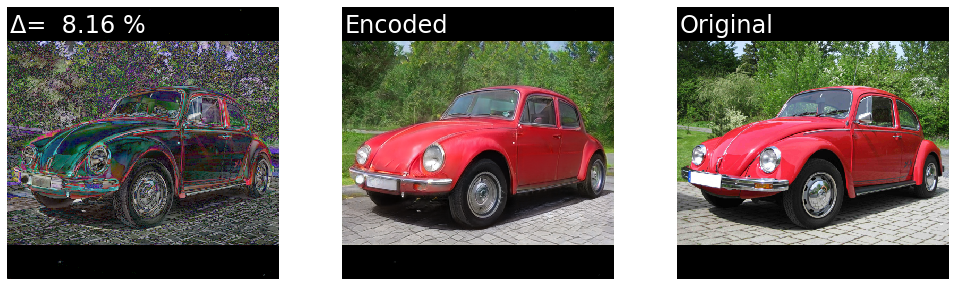

HR_Encoder  199/ 200: [ 1.000, 0.010,100.000,25.000, 0.020], loss≈ 17.3 %   
  best loss≈ 17.3 %


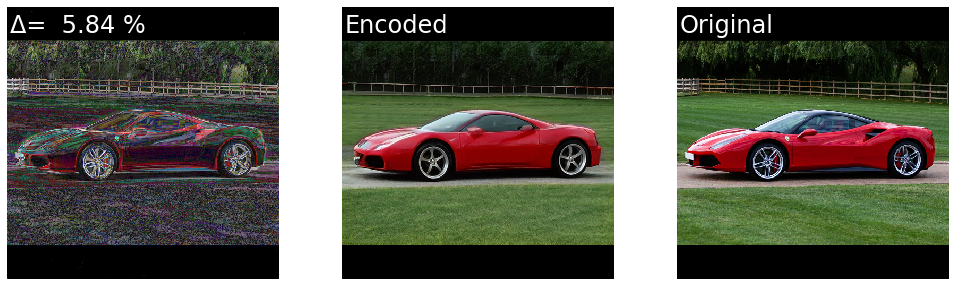

In [11]:
# start encoding with average w to speed up encoding process
w_start=np.ones(model_latent_dim).astype(np.float32)*w_model_avg
# code car1
w_tape=[w_start]
w_tape,target_img=encoder.encodeImage(car1_image,w_tape,steps=200,parameters=[1.0,0.01,100.0,25.0,0.02])
np.save(car1_w,w_tape[-1])
# show encoded image
w_.showDifference(generator,w_tape[-1],target_img)
# code car2
w_tape=[w_start]
w_tape,target_img=encoder.encodeImage(car2_image,w_tape,steps=200,parameters=[1.0,0.01,100.0,25.0,0.02])
np.save(car2_w,w_tape[-1])
# show encoded image
w_.showDifference(generator,w_tape[-1],target_img)

## Morphing between cars in *W* space

In [12]:
# morph between the resulting latent codes w
# morphing in W space is simply adding (1-f)*w1+f*w2 in different fractions f=0...1
w1=np.load(car1_w)
w2=np.load(car2_w)
m_tape=w_.morphTapeSin(w1,w2,50,True)
w_.renderVideo(generator,m_tape,morph_video,video_fps=25)
w_.videoGIF(morph_video,morph_gif,video_fps=25)
w_.showVideo(morph_video,height=512)

# StyleGAN2 cat model
StyleGAN2 cat model generates images of cats in various poses. Unfortunatly the training set contained some crap apparently.  
* model resolution= (256,256,3)
* *w&#8407;* has a shape of (14,512)
* recommended encodeImage() parameters=[1.0,0.01,10.0,25.0,0.02]

Encoding one image of a fcat with 200 optimization steps takes
* approx.  1:40 minutes on a i7-8700T + Nvidia GTX 1050 4GB (imp='cuda',gpu=True)
* approx. 16:00 minutes on a i7-1065G7 w/o CUDA support (imp='ref',gpu=False)

Loaded cat discriminator weights!
Loaded cat generator weights!
HR_Encoder initializing...


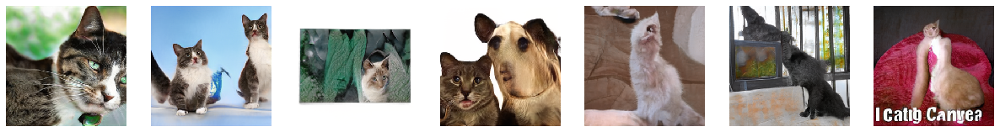

In [13]:
import numpy as np
from stylegan2_generator import StyleGan2Generator
from stylegan2_discriminator import StyleGan2Discriminator
from HR_Encoder import HR_Encoder

model_name = 'cat' # cat model trained by Nvidia
model_resolution=(256,256,3)
model_latent_dim=(14,512)

features = StyleGan2Discriminator(weights=model_name, impl=impl, gpu=gpu, resolution=model_resolution[0],diversion_layer=4)
generator = StyleGan2Generator(weights=model_name, impl=impl, gpu=gpu, resolution=model_resolution[0])
w_model_avg = np.load('weights/{}_dlatent_avg.npy'.format(model_name))

encoder=HR_Encoder(generator,features,resolution=model_resolution)

# some randomly generated examples
w_.showImages(generator,[[w_.random(generator,seed) for seed in range(7)]],(3,3))

In [14]:
cat_image="./HR_images/5.jpg"
cat_w="./w_space/w5.npy" # resulting latent vector w
cat_video="./HR_videos/5.mp4" # video of encoding process
cat_gif="./HR_videos/5.gif" # as animated gif

HR_Encoder  199/ 200: [ 1.000, 0.010,10.000,25.000, 0.020], loss≈ 20.4 %   
  best loss≈ 19.5 %


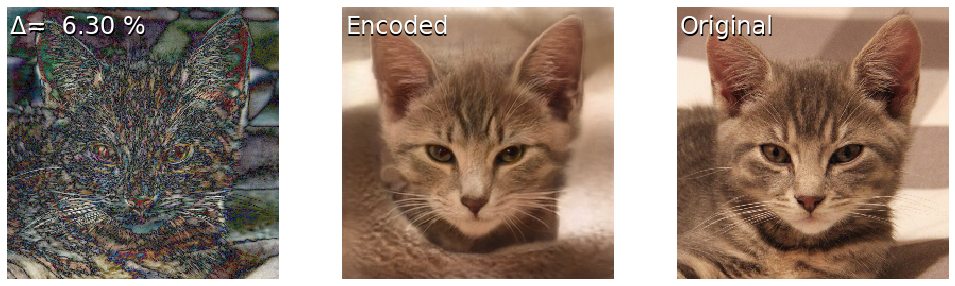

In [15]:
# start encoding with average w to speed up encoding process
w_start=np.ones(model_latent_dim).astype(np.float32)*w_model_avg
# code cat
w_tape=[w_start]
w_tape,target_img=encoder.encodeImage(cat_image,w_tape,steps=200,parameters=[1.0,0.01,10.0,25.0,0.02])
np.save(cat_w,w_tape[-1])
# show encoded image
w_.showDifference(generator,w_tape[-1],target_img)

In [16]:
# StyleGAN2 generates slightly different images for the same w each time - let the wind blow
w=np.load(cat_w)
cat_tape=[w]*5
w_.renderVideo(generator,cat_tape,cat_video,video_fps=10)
w_.videoGIF(cat_video,cat_gif)
w_.showVideo(cat_video,height=256)

# StyleGAN2 church model
Buildings are difficult to encode into StyleGAN2's church model. Increase optimization steps or start with a *w&#8407;* of a similar image.
* StyleGAN2 church model resolution= (256,256,3)
* *w&#8407;* has a shape of (14,512)
* recommended encodeImage() parameters=[1.0,10.0,10.0,50.0,0.02]

Encoding one image of a church with 800(!) optimization steps takes
* approx.  5:00 minutes on a i7-8700T + Nvidia GTX 1050 4GB (imp='cuda',gpu=True)
* approx. 53:00 minutes on a i7-1065G7 w/o CUDA support (imp='ref',gpu=False)

Loaded church discriminator weights!
Loaded church generator weights!
HR_Encoder initializing...


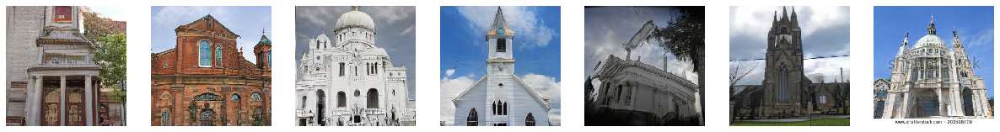

In [17]:
import numpy as np
from stylegan2_generator import StyleGan2Generator
from stylegan2_discriminator import StyleGan2Discriminator
from HR_Encoder import HR_Encoder

model_name = 'church' # cat model trained by Nvidia
model_resolution=(256,256,3)
model_latent_dim=(14,512)

features = StyleGan2Discriminator(weights=model_name, impl=impl, gpu=gpu, resolution=model_resolution[0],diversion_layer=4)
generator = StyleGan2Generator(weights=model_name, impl=impl, gpu=gpu, resolution=model_resolution[0])
w_model_avg = np.load('weights/{}_dlatent_avg.npy'.format(model_name))

encoder=HR_Encoder(generator,features,resolution=model_resolution)

# some randomly generated examples
w_.showImages(generator,[[w_.random(generator,seed) for seed in range(7)]],(3,3))

In [18]:
church_image="./HR_images/6.jpg"
church_w="./w_space/w6.npy" # resulting latent vector w
church_video="./HR_videos/6.mp4" # video of church
church_gif="./HR_videos/6.gif" # as animated gif
church_encoding="./HR_videos/6e.mp4" # video of encoding process

HR_Encoder  799/ 800: [ 1.000,10.000,10.000,50.000, 0.020], loss≈ 4.3 %    
  best loss≈ 4.1 %


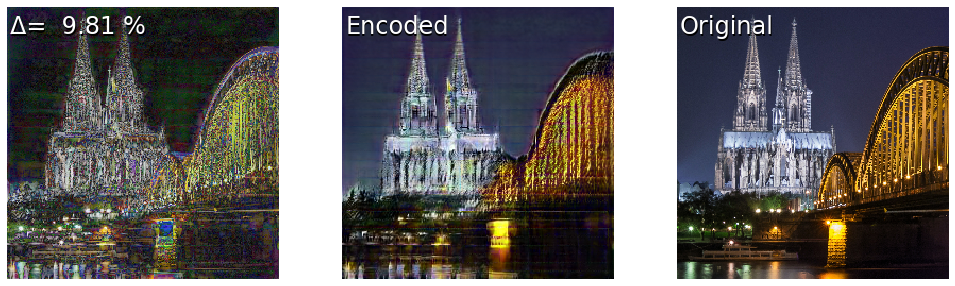

In [19]:
# start encoding with average w to speed up encoding process
w_start=np.ones((model_latent_dim)).astype(np.float32)*w_model_avg
# code church
w_tape=[w_start]
w_tape,target_img=encoder.encodeImage(church_image,w_tape,steps=800,parameters=[1.0,10.0,10.0,50.0,0.02])
np.save(church_w,w_tape[-1])
# show encoded image
w_.showDifference(generator,w_tape[-1],target_img)

In [20]:
# StyleGAN2 generates slightly different images for the same w each time - let's time lapse
w=np.load(church_w)
church_tape=[w]*5
w_.renderVideo(generator,church_tape,church_video,video_fps=10)
w_.videoGIF(church_video,church_gif)
w_.showVideo(church_video,height=256)

In [21]:
# visualize encoding process
w_.renderVideo(generator,(w_.speedupTape(w_tape,speed=0.1,acc=1.15)+[w_tape[-1]]*5)[5::],church_encoding,video_fps=15)
w_.showVideo(church_encoding,height=256)

# StyleGAN2 horse model
tHE training set of StyleGAN's horse model was widely spread. To get a good result start encoding with a *w&#8407;* generating a similar result to your own image. See random-w-generated examples below.  
* model resolution= (256,256,3)
* *w&#8407;* has a shape of (14,512)
* rcommended encodeImage() parameters=[1.0,0.1,10.0,50.0,0.02]

Encoding one image of a horse with 200 optimization steps takes
* approx.  1:40 minutes on a i7-8700T + Nvidia GTX 1050 4GB (imp='cuda',gpu=True)
* approx. 16:00 minutes on a i7-1065G7 w/o CUDA support (imp='ref',gpu=False)

Loaded horse discriminator weights!
Loaded horse generator weights!
HR_Encoder initializing...


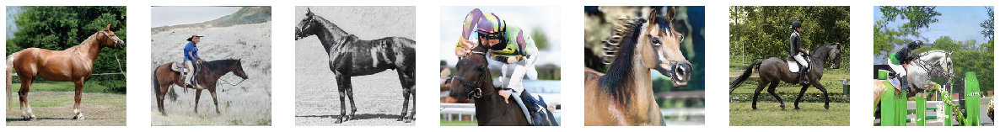

In [22]:
import numpy as np
from stylegan2_generator import StyleGan2Generator
from stylegan2_discriminator import StyleGan2Discriminator
from HR_Encoder import HR_Encoder

model_name = 'horse' # cat model trained by Nvidia
model_resolution=(256,256,3)
model_latent_dim=(14,512)

features = StyleGan2Discriminator(weights=model_name, impl=impl, gpu=gpu, resolution=model_resolution[0],diversion_layer=4)
generator = StyleGan2Generator(weights=model_name, impl=impl, gpu=gpu, resolution=model_resolution[0])
w_model_avg = np.load('weights/{}_dlatent_avg.npy'.format(model_name))

encoder=HR_Encoder(generator,features,resolution=model_resolution)

# some randomly generated examples
w_.showImages(generator,[[w_.random(generator,seed) for seed in [12,43,432,99,345,678,8913]]],(3,3))

In [23]:
horse_image="./HR_images/7.jpg"
horse_w="./w_space/w7.npy" # resulting latent vector w
horse_video="./HR_videos/7.mp4" # video of horse morphing
horse_gif="./HR_videos/7.gif"

HR_Encoder  199/ 200: [ 1.000, 0.100,10.000,50.000, 0.020], loss≈ 11.9 %   
  best loss≈ 11.7 %


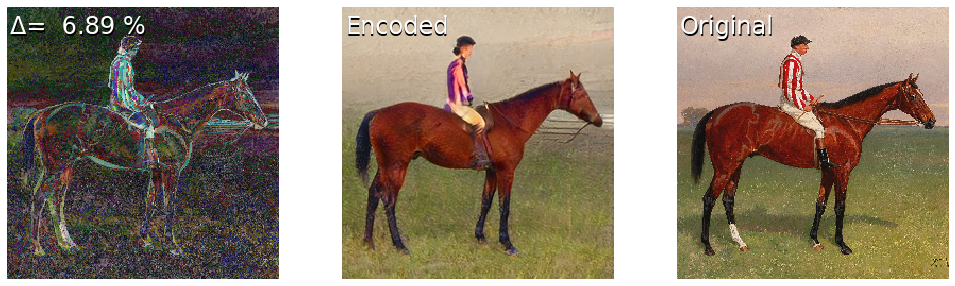

In [24]:
# start encoding with average w to speed up encoding process
# w_start=np.ones((model_latent_dim)).astype(np.float32)*w_model_avg

# better start encoding with a similar image (taken from the random examples above)
#w_start=w_.random(generator,12)[0:14] # w/o  jockey
w_start=w_.random(generator,43)[0:14] # with jockey

# code horse
w_tape=[w_start]
w_tape,target_img=encoder.encodeImage(horse_image,w_tape,steps=200,parameters=[1.0,0.1,10.0,50.0,0.02])
np.save(horse_w,w_tape[-1])
# show encoded image
w_.showDifference(generator,w_tape[-1],target_img)

## Bonus: videos out of nothing

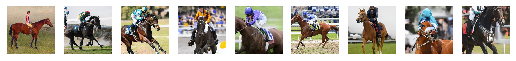

In [25]:
seed=[2027,2443,3513,1142,3312,5915,2440,4613]
w=[np.load("./w_space/w7.npy")]
w_tape=w+[w_.random(generator,s)[0:14] for s in seed]
w_.showImages(generator,[w_tape])
w_video=w_.morphTape(w_tape,75,30,2.0)
w_.renderVideo(generator,w_video,horse_video,video_fps=15)
w_.videoGIF(horse_video,horse_gif)
w_.showVideo(horse_video,height=256)